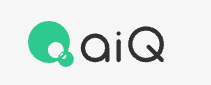

[disclaimer](../../disclaimer.txt/)

# alternative data evaluation for multiple datasets 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import numpy as np
import pandas as pd
import plotly.io
from aiq_strategy_robot.data.data_accessor import DAL

if '../..' not in sys.path:
    sys.path.append('../..')
    
from libs.dataset import multi as sc

In [3]:
verbose = False

## Data Load & Transfomation
In this section, all data are labeled with the earliest date that can be obtained.

### Data Load

Retrieve each factor and register it to `handler`.
> In this sample, retrieval and registration operations are omitted.

In [4]:
sdh = DAL()

In [5]:
sdh.extract.clear()

# dfsyms = sc.load_symbols()
# list_figis = dfsyms['FIGI'].unique().tolist()
# list_tickers = dfsyms['TICKER'].unique().tolist()

# Load POS Data
data_id_pos = sc.register_pos_data(sdh)
display(sdh.get_raw_data(data_id_pos).tail())

# Price Data (origin: FactSet HTTP API)
data_id_price = sc.register_market_prices(sdh)
display(sdh.get_raw_data(data_id_price).tail())


# TruValue data (origin: FactSet Snowflake)
data_id_tv = sc.register_tv(sdh)
display(sdh.get_raw_data(data_id_tv).tail())

# Quants factors
data_id_f266 = sc.register_quants_factors(sdh)
display(sdh.get_raw_data(data_id_f266).tail())



pos_sales     share  unit_price  unit_price_vs_ind
TICKER  DATETIME                                                      
9997-JP 2024-02-08   0.012324  0.000572    0.691312           0.493701
        2024-02-15   0.005229  0.000243    0.829920           0.575624
        2024-02-22   0.008494  0.000395    0.813988           0.557915
        2024-02-29   0.006700  0.000317    0.768075           0.509813
        2024-03-07   0.008056  0.000368    0.798211           0.560644

fsymId  TICKER_REGION    volume   open   high    low  \
TICKER  DATETIME                                                             
9997-JP 2023-10-27  BT5ZHY-R           9997  290300.0  622.0  628.0  622.0   
        2023-10-30  BT5ZHY-R           9997  409300.0  622.0  625.0  607.0   
        2023-10-31  BT5ZHY-R           9997  528300.0  610.0  613.0  604.0   
        2023-11-01  BT5ZHY-R           9997  421200.0  627.0  633.0  619.0   
        2023-11-02  BT5ZHY-R           9997  323800.0  631.0  631.0  621.0   

                    close currency  
TICKER  DATETIME                    
9997-JP 2023-10-27  626.0      JPY  
        2023-10-30  612.0      JPY  
        2023-10-31  612.0      JPY  
        2023-11-01  628.0      JPY  
        2023-11-02  628.0      JPY

MATERIALITY_ADJ_INSIGHT  MATERIALITY_IND_PCTL  \
TICKER  DATETIME                                                    
9997-JP 2023-11-16                    64.42                 40.63   
        2023-11-17                    64.41                 40.35   
        2023-11-18                    64.40                 40.28   
        2023-11-19                    64.35                 40.37   
        2023-11-20                    64.40                 40.23   

                    ALL_CATEGORIES_ADJ_INSIGHT  ALL_CATEGORIES_INSIGHT  \
TICKER  DATETIME                                                         
9997-JP 2023-11-16                       76.55               76.545724   
        2023-11-17                       76.56               76.564881   
        2023-11-18                       76.58               76.583965   
        2023-11-19                       76.60               76.602976   
        2023-11-20                       76.62               76.621916   

                    ALL_CATEGORIES_MOMENTUM  ALL_CATEGORIES_PULSE  
TICKER  DATETIME                                                   
9997-JP 2023-11-16                81.457731               81.5853  
        2023-11-17                81.409830               81.5853  
        2023-11-18                81.362007               81.5853  
        2023-11-19                81.314263               81.5853  
        2023-11-20                81.266596               81.5853

mktVal  retMom252D         ey      roe        bp
TICKER  DATETIME                                                        
9997-JP 2023-10-25  406.036593    -6.88040  13.298766  6.02091  2.208923
        2023-10-26  399.741141    -8.16547  13.506853  6.02091  2.243487
        2023-10-27  406.905111    -6.47612  13.269051  6.02091  2.203988
        2023-10-30  397.751893    -7.96944  13.574404  6.02091  2.254707
        2023-10-31  394.940619    -8.76623  14.265102  6.02091  2.238126

In [6]:
# Set Alias (Optional)
sdh.set_alias({
    data_id_price: 'FTech',
    data_id_f266: 'FFactor',
    data_id_pos: 'FPos',
    data_id_tv: 'FTV',
})

sdh.extract_definition

,category,data_source,source,table,alias,tickers,index,start_datetime,end_datetime
data_id,,,,,,,,,
1,RawData,ALTERNATIVE,aiq_pos_csmr_goods,Unknown,FPos,"[1301-JP, 1332-JP, 1333-JP, 1379-JP, 1380-JP, ...","[TICKER, DATETIME]",2008-03-20 00:00:00,2024-03-07 00:00:00
2,RawData,FACTSET,gpd_prices,Unknown,FTech,"[1301-JP, 1332-JP, 1333-JP, 1379-JP, 1380-JP, ...","[TICKER, DATETIME]",2016-01-04 00:00:00,2023-11-02 00:00:00
3,RawData,FACTSET,TrueValue,Unknown,FTV,"[1301-JP, 1332-JP, 1333-JP, 1379-JP, 1380-JP, ...","[TICKER, DATETIME]",2016-01-01 00:00:00,2023-11-20 00:00:00
4,RawData,FACTSET,Quants factors,Unknown,FFactor,"[1301-JP, 1332-JP, 1333-JP, 1379-JP, 1380-JP, ...","[TICKER, DATETIME]",2016-01-29 00:00:00,2023-10-31 00:00:00


### Transformations
> In this sample, detailed transformation operations are omitted.

In [7]:
sdh.transform.verbose = verbose

In [8]:
# Make Features
resample_term = 'W-FRI'
baselines = sc.make_baseline(sdh, data_id_price, data_id_f266, data_id_tv, data_id_pos, X_shift=2, resample_term=resample_term)
FTV_MATERIALITY_ADJ_INSIGHT, *_ = baselines['FTV']
FPos_sales, FPos_share = baselines['FPos']

# Make return
open_return = sdh.transform.resample(
    data_id=data_id_price,
    fields='open',
    rule=resample_term,
    func='first',
    label='left',
    closed='left'
).dropna().calc_return().variable_ids[-1]
sdh.transform.set_return_type()

,variable_id,data_id,root_field,return_type,other_roots,step_001,step_002,step_003
variable_name,,,,,,,,
"Ftech_Open_Resampled(W-FRI|first, closed=""left"", label=""left"", origin=""start_day"")_Dropna(how=""any"")_PctChange(001, drop_minus=True)",66,2,open,arithmetic,-,"resample(rule=""W-FRI"", func=""first"", closed=""l...","dropna(how=""any"")","pct_change(periods=1, drop_minus=True)"


In [9]:
sdh.transform.definition.tail()

,variable_id,data_id,data_source,source,table,field,ticker,reference_id,variable_type,method,params,process_id,return_type
variable_name,,,,,,,,,,,,,
"Fpos_Pos_sales_MovePrevDay(bday=""Fri"", direction=""prev"")_Resampled(W-FRI|last, closed=""left"", label=""left"", origin=""start_day"")_SMA(012)_Diff(052)_Shifted(002)",62,1,ALTERNATIVE,aiq_pos_csmr_goods,Unknown,"Fpos_Pos_sales_MovePrevDay(bday=""Fri"", directi...",None,60.0,feature,shift,periods=2,27,None
"Fpos_Share_MovePrevDay(bday=""Fri"", direction=""prev"")_Resampled(W-FRI|last, closed=""left"", label=""left"", origin=""start_day"")_SMA(012)_Diff(052)_Shifted(002)",63,1,ALTERNATIVE,aiq_pos_csmr_goods,Unknown,"Fpos_Share_MovePrevDay(bday=""Fri"", direction=""...",None,61.0,feature,shift,periods=2,27,None
"Ftech_Open_Resampled(W-FRI|first, closed=""left"", label=""left"", origin=""start_day"")",64,2,FACTSET,gpd_prices,Unknown,open,None,NaN,feature,resample,"rule=""W-FRI"", func=""first"", closed=""left"", lab...",28,None
"Ftech_Open_Resampled(W-FRI|first, closed=""left"", label=""left"", origin=""start_day"")_Dropna(how=""any"")",65,2,FACTSET,gpd_prices,Unknown,"Ftech_Open_Resampled(W-FRI|first, closed=""left...",None,64.0,feature,dropna,"how=""any""",29,None
"Ftech_Open_Resampled(W-FRI|first, closed=""left"", label=""left"", origin=""start_day"")_Dropna(how=""any"")_PctChange(001, drop_minus=True)",66,2,FACTSET,gpd_prices,Unknown,"Ftech_Open_Resampled(W-FRI|first, closed=""left...",None,65.0,feature,pct_change,"periods=1, drop_minus=True",30,arithmetic


## Baseline

In [10]:
from aiq_strategy_robot.evaluator import AltDataEvaluator

# Initialize AltDataEvaluator
ade = AltDataEvaluator(sdh)

In [11]:
start_date = '2018-02-25'
end_date = '2023-10-27'


### backtesting by single data

In [12]:
dfqret, stats, dfsigqt = ade.q_backtest(
    FPos_sales,
    open_return,
    nq=4,
    fromd=start_date,
    tod=end_date,
    shift_signal=0,
    plot='Pos Sales Backtest'
)

cum.Ret   ann.Ret   ann.Std       R/R     Win_R  \
001 #1          -0.063245 -0.011482  0.147069 -0.078069  0.533784   
    #2           0.082230  0.014066  0.154083  0.091288  0.574324   
    #3           0.270577  0.043236  0.149216  0.289757  0.564189   
    #4           0.309883  0.048870  0.148949  0.328097  0.550676   
    #4-#1        0.390293  0.059973  0.051128  1.172998  0.550676   
    #4-#1(cost)  0.380381  0.058633  0.051119  1.147009  0.550676   

                 ann.TurnOver    Max_DD  Calmar Ratio  
001 #1               3.373850 -0.336133     -0.034158  
    #2               6.182860 -0.357259      0.039372  
    #3               6.254366 -0.259440      0.166653  
    #4               2.958474 -0.291834      0.167457  
    #4-#1            6.332325 -0.068712      0.872822  
    #4-#1(cost)      6.332325 -0.069286      0.846255

In [13]:
dfqret, stats, dfsigqt = ade.q_backtest(
    FTV_MATERIALITY_ADJ_INSIGHT,
    open_return,
    nq=4,
    fromd=start_date,
    tod=end_date,
    shift_signal=0,
    plot='TruValue Insight Backtest'
)

cum.Ret   ann.Ret   ann.Std       R/R     Win_R  \
001 #1           0.049269  0.008537  0.173865  0.049101  0.520270   
    #2           0.077331  0.013253  0.154344  0.085866  0.550676   
    #3           0.057690  0.009963  0.157986  0.063063  0.533784   
    #4           0.310682  0.048983  0.175405  0.279254  0.543919   
    #4-#1        0.230302  0.037314  0.077837  0.479381  0.550676   
    #4-#1(cost)  0.224409  0.036434  0.077851  0.467994  0.550676   

                 ann.TurnOver    Max_DD  Calmar Ratio  
001 #1               2.597261 -0.292556      0.029181  
    #2               6.500852 -0.343110      0.038626  
    #3               5.958059 -0.346576      0.028747  
    #4               1.642840 -0.334012      0.146649  
    #4-#1            4.240101 -0.182505      0.204452  
    #4-#1(cost)      4.240101 -0.184154      0.197843

### backtesting by multiple data

In [14]:
dfqret, stats, dfsigqt = ade.q_backtest(
    (FPos_sales, FTV_MATERIALITY_ADJ_INSIGHT),
    open_return,
    nq=(4, 4),
    fromd=start_date,
    tod=end_date,
    shift_signal=0,
    plot='Pos Sales * TruValue Insight Backtest'
)

cum.Ret   ann.Ret   ann.Std       R/R     Win_R  \
001 #1           -0.241686 -0.047724  0.172548 -0.276585  0.486486   
    #2           -0.191308 -0.036836  0.212567 -0.173292  0.493243   
    #3            0.184116  0.030322  0.191590  0.158264  0.523649   
    #4            0.671658  0.095072  0.180784  0.525885  0.567568   
    #5           -0.052051 -0.009404  0.165726 -0.056743  0.530405   
    #6           -0.039970 -0.007184  0.169939 -0.042274  0.530405   
    #7           -0.082744 -0.015150  0.165075 -0.091778  0.510135   
    #8            0.457385  0.068840  0.161723  0.425667  0.550676   
    #9           -0.089224 -0.016384  0.160683 -0.101962  0.510135   
    #10           0.525854  0.077549  0.179176  0.432809  0.557432   
    #11          -0.051323 -0.009270  0.170631 -0.054325  0.523649   
    #12           0.051860  0.008977  0.163896  0.054772  0.543919   
    #13           0.034176  0.005957  0.187763  0.031729  0.530405   
    #14           0.412939  0.063005  0.194551  0.323847  0.557432   
    #15           0.047211  0.008187  0.196540  0.041657  0.527027   
    #16           0.686486  0.096782  0.174062  0.556022  0.560811   
    #16-#1        1.158307  0.145662  0.104427  1.394868  0.564189   
    #16-#1(cost)  1.129200  0.142915  0.104442  1.368365  0.564189   

                  ann.TurnOver    Max_DD  Calmar Ratio  
001 #1                6.542597 -0.390044     -0.122356  
    #2               11.824684 -0.423887     -0.086901  
    #3               12.530278 -0.316381      0.095839  
    #4               11.667148 -0.248882      0.381995  
    #5               15.766114 -0.357605     -0.026297  
    #6               17.967752 -0.360676     -0.019918  
    #7               18.575199 -0.389608     -0.038886  
    #8               15.686176 -0.290160      0.237248  
    #9               17.578572 -0.360822     -0.045406  
    #10              18.125251 -0.299343      0.259063  
    #11              17.151311 -0.380655     -0.024351  
    #12              12.084933 -0.332819      0.026972  
    #13               8.323230 -0.424237      0.014043  
    #14              10.439654 -0.325668      0.193463  
    #15               9.895168 -0.395169      0.020718  
    #16               5.478751 -0.275293      0.351561  
    #16-#1           12.021348 -0.081824      1.780186  
    #16-#1(cost)     12.021348 -0.084287      1.695589

## Machine Learning


In [15]:
from aiq_strategy_robot.predictors import ScikitLearnPredictor

slp = ScikitLearnPredictor(sdh)
ade = AltDataEvaluator(sdh)

In [16]:
from sklearn.linear_model import Lasso
model = Lasso(alpha=0.0001)

In [17]:
_baselines = [];[_baselines.extend(v) for v in baselines.values()]

[None, None, None, None]

### Prediction by Baseline
#### Model fitting and prediction.

In [18]:
pred_name = 'simple_prediction'

dfpred, dfstats = slp.sliding_window(
    features=_baselines,
    objective=open_return,
    model=model,
    test_start='2021-02-26', 
    test_end='2023-10-27', 
    test_periods=4*3,
    train_periods=52*3,
    period_freq='W-FRI',
    min_train_sample=50,
    dropna=True,
    pred_name=pred_name,
    verbose=verbose
)

,RMSE,MAE,rho,t-val,nsample
Stats.,0.033237,0.023503,0.046177,6.791606,21588.0


##### Calculate the correlation between the prediction results and KPI.

In [19]:
rho_time = ade.compu_rho(pred_name, open_return, by='ticker', rename_features=[pred_name])
rho_time.T.xs('t-val', level=1).sort_values(pred_name, ascending=False).head()


,simple_prediction
TICKER,
3591-JP,3.606907
2931-JP,3.199992
4005-JP,3.169609
4574-JP,2.860175
4922-JP,2.795189


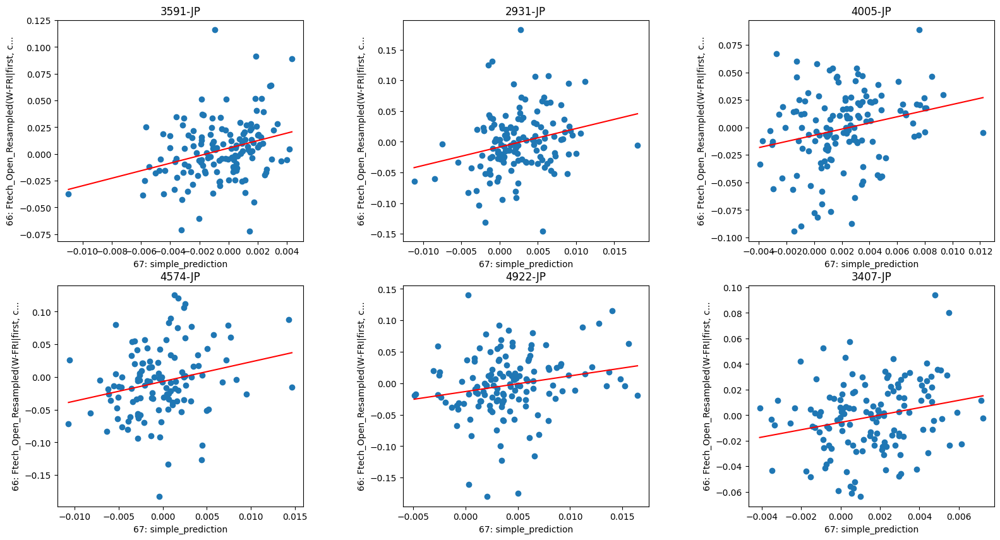

In [20]:
top6tickers = rho_time.T.xs('t-val', level=1).sort_values(pred_name, ascending=False).index[:6]

sdh.show_scatter_per_target(
    y=open_return,
    x=pred_name,
    targets=top6tickers,
    col_num=3,
    vname_len_limit=35,
)

##### Backtesting of predicted results as signals.

In [21]:
dfqret, stats, dfsigqt = ade.q_backtest(
    pred_name,
    open_return,
    nq=3,
    fromd=start_date,
    tod=end_date,
    plot=f'Baseline Prediction-by-[{pred_name}] Backtest'
)

cum.Ret   ann.Ret   ann.Std       R/R     Win_R  \
001 #1          -0.042708 -0.016240  0.098507 -0.164859  0.514286   
    #2           0.082659  0.030241  0.117761  0.256798  0.485714   
    #3           0.203226  0.071866  0.142785  0.503317  0.557143   
    #3-#1        0.263241  0.091617  0.082723  1.107515  0.578571   
    #3-#1(cost)  0.239637  0.083920  0.082709  1.014648  0.564286   

                 ann.TurnOver    Max_DD  Calmar Ratio  
001 #1              17.455840 -0.199967     -0.081212  
    #2              27.343558 -0.165324      0.182918  
    #3              17.982920 -0.151498      0.474370  
    #3-#1           35.438760 -0.060624      1.511234  
    #3-#1(cost)     35.438760 -0.061877      1.356239

#### Model fitting and prediction with pre-processing parameters　

In [22]:
pred_name = 'prediction_with_pre-processing'

dfpred, dfstats = slp.sliding_window(
    features=_baselines,
    objective=open_return,
    model=model,
    test_start='2021-02-25', 
    test_end='2023-10-27', 
    test_periods=4*3,
    train_periods=52*3,
    period_freq= 'W-FRI',
    min_train_sample=50,
    
    # Main pre-treatment parameters.
    clip_q = 0.01,                # Quantile used for clipping features.
    clip_q_Y=False,                # Specifies whether to apply clipping to the objective (Y) as defined by `clip_q`
    normal_scaling='datetime',    # Type of normalization applied to features.
    normal_scaling_Y=False,       # Specifies whether to apply normalization to the objective (Y) as defined by `normal_scaling`
    impute_x=None,                # Specifies the method for imputing missing values in features. Ffill, KNN and Iterative can be specified.
    dropna=True,                  # If True, rows containing missing values will be dropped. Default is False.
    calc_shap=True,
    pred_name=pred_name,
    verbose=verbose
)

,RMSE,MAE,rho,t-val,nsample
Stats.,0.033214,0.023414,0.036274,5.332983,21588.0


#### Refer to the `trained_model` property and check shap  
Access the `explainer` from the `results` object for each model.  
The following drawing methods can be invoked.
- beeswarm
- bar
- waterfall
- force
- force_all

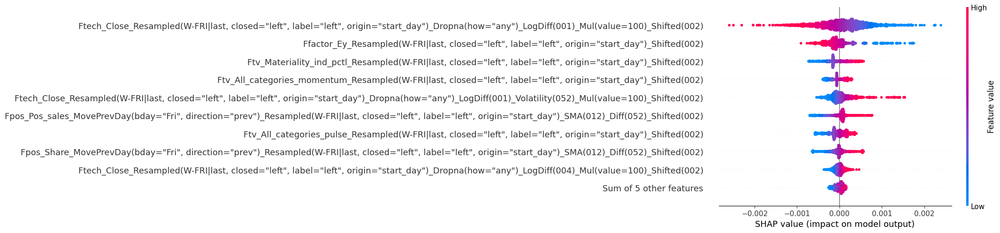

In [23]:
slp.trained_model.results[0].explainer.beeswarm()

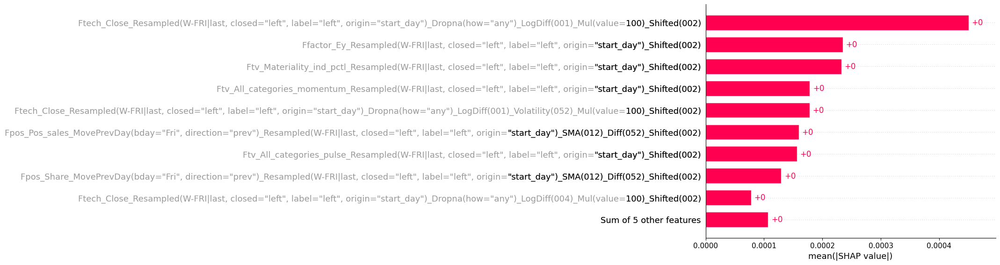

In [24]:
slp.trained_model.results[0].explainer.bar()

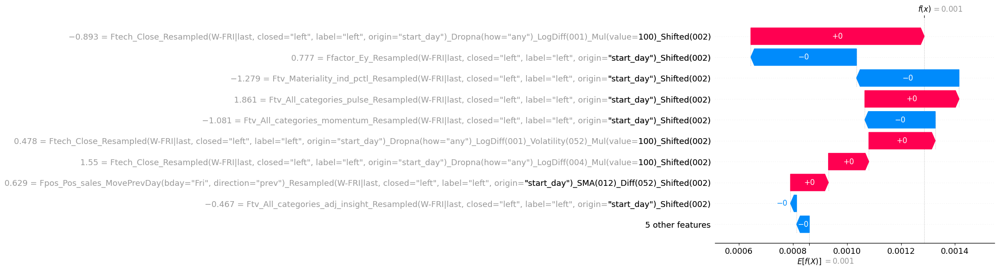

In [25]:
slp.trained_model.results[0].explainer.waterfall()

In [26]:
slp.trained_model.results[0].explainer.force()

In [27]:
slp.trained_model.results[0].explainer.force_all()

##### Calculate the correlation between the prediction results and KIP.

In [28]:
rho_time = ade.compu_rho(pred_name, open_return, by='ticker', rename_features=[pred_name])
rho_time.T.xs('t-val', level=1).sort_values(pred_name, ascending=False).head()

,prediction_with_pre-processing
TICKER,
3591-JP,2.863008
4005-JP,2.327776
7956-JP,2.180588
4188-JP,2.124444
2001-JP,2.105534


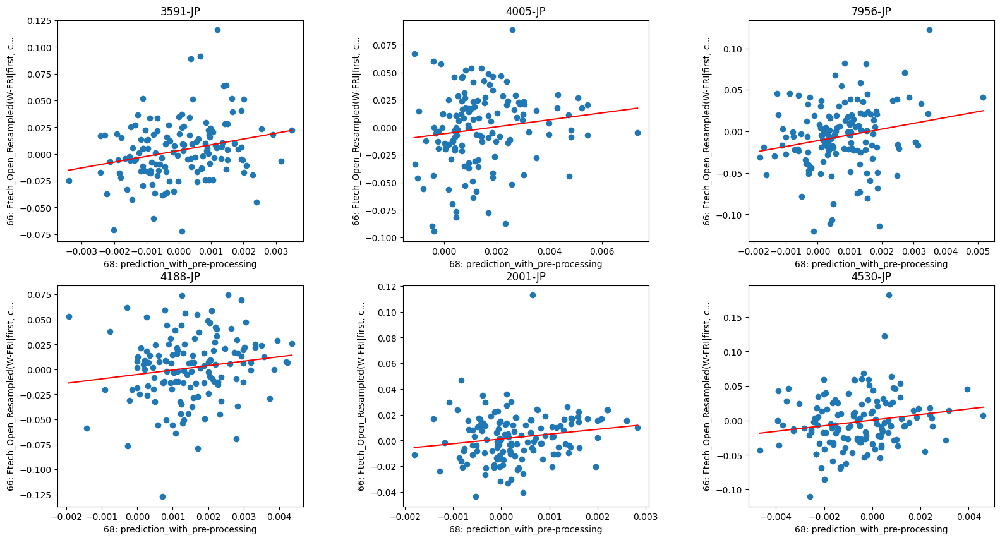

In [29]:
top6tickers = rho_time.T.xs('t-val', level=1).sort_values(pred_name, ascending=False).index[:6]

sdh.show_scatter_per_target(
    y=open_return,
    x=pred_name,
    targets=top6tickers,
    col_num=3,
    vname_len_limit=35,
)

##### Backtesting of predicted results as signals.

In [30]:
_baselines

[28, 31, 34, 37, 40, 41, 48, 49, 50, 51, 52, 53, 62, 63]

In [31]:
dfqret, stats, dfsigqt = ade.q_backtest(
    pred_name,
    open_return,
    nq=3,
    fromd=start_date,
    tod=end_date,
    shift_signal=0,
    qmax=None,
    qmin=None,
    swap_long_short=False,
    plot=f'Baseline Prediction-by-[{pred_name}] Backtest'
)

cum.Ret   ann.Ret   ann.Std       R/R     Win_R  \
001 #1          -0.114627 -0.044643  0.106132 -0.420638  0.514286   
    #2           0.126933  0.045848  0.114318  0.401052  0.550000   
    #3           0.253393  0.088417  0.133314  0.663222  0.564286   
    #3-#1        0.419867  0.140545  0.063572  2.210784  0.642857   
    #3-#1(cost)  0.392334  0.132198  0.063550  2.080224  0.642857   

                 ann.TurnOver    Max_DD  Calmar Ratio  
001 #1              17.849645 -0.230634     -0.193567  
    #2              27.796142 -0.128426      0.356997  
    #3              18.973819 -0.153572      0.575737  
    #3-#1           36.823464 -0.038206      3.678651  
    #3-#1(cost)     36.823464 -0.039297      3.364083

### ***************************** CPCV Prediction *******************************

In [32]:
import lightgbm as lgb
from sklearn.linear_model import Lasso, ElasticNet, LogisticRegression, Ridge
from sklearn.ensemble import RandomForestRegressor

In [33]:
# estimator = Lasso(alpha=0.0001)
# estimator = RandomForestRegressor(n_estimators=100, random_state=42)

# estimator = LogisticRegression(max_iter=200)
estimator = lgb.LGBMRegressor(random_state=0, verbose=-1)

#### Predictor実行

In [34]:
dfpred, dfstats = slp.cpcv(
    pred_name='cpcv',
    objective=open_return,
    features=_baselines,
    model=estimator,
    fromd='2021-02-25', 
    tod='2023-10-27', 
    n_splits=6, 
    n_test_folds=2,
    n_purge=2,
    n_embargo=2,
    register=True,
    dropna=True,
    clip_q=0,
    clip_q_Y=False,
    normal_scaling=None,
    normal_scaling_Y=False,
    calc_shap=True,
    verbose=True
)

Prediction running..: 100%|██████████| 15/15 [00:17<00:00,  1.17s/it]


Stats.,MAE,RMSE,nsample,rho,t-val
Pred,,,,,
cpcv_001,0.023900,0.033776,21588.0,0.049573,7.292345
cpcv_002,0.023839,0.033763,21588.0,0.048147,7.082035
cpcv_003,0.023868,0.033806,21588.0,0.044228,6.504441
cpcv_004,0.023998,0.033936,21588.0,0.038082,5.599168
cpcv_005,0.023924,0.033903,21588.0,0.045279,6.659341


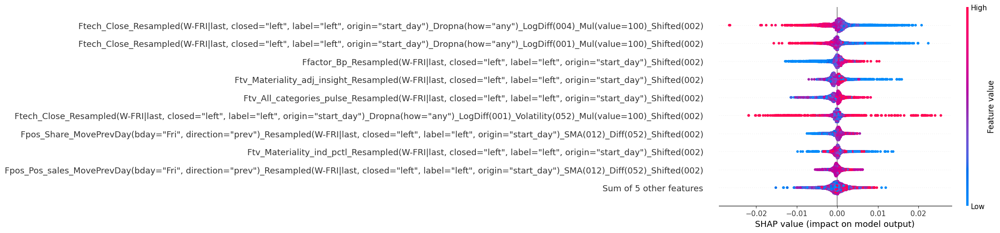

In [35]:
slp.trained_model.results[0].explainer.beeswarm()

#### Backtest実行

In [36]:
dfqret, stats, dfsigqt = ade.q_backtest(
    sdh.transform.variable_names,
    open_return,
    nq=3,
    fromd=start_date,
    tod=end_date,
    plot=f'Baseline Prediction-by-[{pred_name}] Backtest'
)

cum.Ret   ann.Ret   ann.Std       R/R     Win_R  \
001 #1          -0.059313 -0.022676  0.115760 -0.195889  0.550000   
    #2           0.038995  0.014454  0.112099  0.128937  0.535714   
    #3           0.279551  0.096883  0.125652  0.771047  0.542857   
    #3-#1        0.359475  0.122099  0.051453  2.373019  0.621429   
    #3-#1(cost)  0.329034  0.112607  0.051475  2.187621  0.607143   
002 #1          -0.051734 -0.019729  0.115521 -0.170788  0.485714   
    #2           0.045532  0.016843  0.107269  0.157016  0.528571   
    #3           0.260425  0.090704  0.131759  0.688409  0.592857   
    #3-#1        0.329769  0.112838  0.060191  1.874672  0.614286   
    #3-#1(cost)  0.300711  0.103653  0.060221  1.721211  0.607143   
003 #1          -0.014883 -0.005609  0.118532 -0.047324  0.528571   
    #2           0.056383  0.020789  0.107490  0.193407  0.521429   
    #3           0.201034  0.071133  0.127573  0.557587  0.557143   
    #3-#1        0.217383  0.076580  0.057156  1.339837  0.607143   
    #3-#1(cost)  0.191893  0.068068  0.057141  1.191234  0.585714   
004 #1           0.003528  0.001322  0.117547  0.011247  0.535714   
    #2           0.003740  0.001401  0.107317  0.013057  0.521429   
    #3           0.240636  0.084248  0.129232  0.651911  0.542857   
    #3-#1        0.235954  0.082711  0.055277  1.496307  0.600000   
    #3-#1(cost)  0.209114  0.073831  0.055298  1.335147  0.585714   
005 #1          -0.058263 -0.022267  0.118521 -0.187873  0.535714   
    #2           0.087547  0.031983  0.111550  0.286717  0.557143   
    #3           0.221228  0.077854  0.125952  0.618125  0.578571   
    #3-#1        0.293729  0.101427  0.059046  1.717746  0.592857   
    #3-#1(cost)  0.265113  0.092224  0.059033  1.562233  0.578571   

                 ann.TurnOver    Max_DD  Calmar Ratio  
001 #1              20.829831 -0.240326     -0.094356  
    #2              26.561001 -0.160202      0.090222  
    #3              21.728581 -0.134921      0.718073  
    #3-#1           42.558412 -0.020261      6.026379  
    #3-#1(cost)     42.558412 -0.021222      5.306278  
002 #1              20.985201 -0.213174     -0.092551  
    #2              26.493822 -0.153589      0.109663  
    #3              20.526444 -0.145140      0.624941  
    #3-#1           41.511645 -0.040276      2.801601  
    #3-#1(cost)     41.511645 -0.040943      2.531638  
003 #1              19.999237 -0.203330     -0.027587  
    #2              25.969560 -0.162070      0.128273  
    #3              19.746388 -0.142480      0.499249  
    #3-#1           39.745625 -0.042356      1.807984  
    #3-#1(cost)     39.745625 -0.044354      1.534648  
004 #1              20.301495 -0.220133      0.006006  
    #2              26.900783 -0.151962      0.009221  
    #3              20.930718 -0.141652      0.594756  
    #3-#1           41.232212 -0.045415      1.821242  
    #3-#1(cost)     41.232212 -0.047431      1.556579  
005 #1              20.963498 -0.237295     -0.093837  
    #2              26.833769 -0.148032      0.216056  
    #3              21.065878 -0.143561      0.542304  
    #3-#1           42.029376 -0.062088      1.633596  
    #3-#1(cost)     42.029376 -0.064641      1.426709

In [37]:
# statsのみの表示 - mean
ade.bktest.disp_stats(disp_type='mean')

cum.Ret   ann.Ret   ann.Std       R/R     Win_R  \
mean #1          -0.036133 -0.013792  0.117176 -0.118125  0.527143   
     #2           0.046439  0.017094  0.109145  0.155827  0.532857   
     #3           0.240575  0.084164  0.128033  0.657416  0.562857   
     #3-#1        0.287262  0.099131  0.056625  1.760316  0.607143   
     #3-#1(cost)  0.259173  0.090077  0.056633  1.599489  0.592857   

                  ann.TurnOver    Max_DD  Calmar Ratio  
mean #1              20.615852 -0.222851     -0.060465  
     #2              26.551787 -0.155171      0.110687  
     #3              20.799602 -0.141551      0.595865  
     #3-#1           41.415454 -0.042079      2.818161  
     #3-#1(cost)     41.415454 -0.043718      2.471170

In [38]:
# statsのみの表示 - std
ade.bktest.disp_stats(disp_type='std')

cum.Ret   ann.Ret   ann.Std       R/R     Win_R  \
std #1           0.028701  0.010970  0.001461  0.094121  0.024432   
    #2           0.030283  0.011053  0.002455  0.099564  0.014812   
    #3           0.031028  0.010176  0.002527  0.079706  0.022246   
    #3-#1        0.060372  0.019358  0.003443  0.398998  0.011294   
    #3-#1(cost)  0.058467  0.019006  0.003438  0.386863  0.013363   

                 ann.TurnOver    Max_DD  Calmar Ratio  
std #1               0.442181  0.015780      0.046880  
    #2               0.368696  0.005845      0.074376  
    #3               0.730577  0.003929      0.083643  
    #3-#1            1.062357  0.014924      1.851380  
    #3-#1(cost)      1.062357  0.015538      1.646659